In [ ]:
!pip install -q opencv-python numpy matplotlib scikit-learn tqdm torch tensorflow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import os
import torch.nn as nn
from tqdm import tqdm
from torch.utils.data import DataLoader, Dataset
import librosa
import soundfile as sf
import pandas as pd
import torch
import scipy
import re


In [ ]:
# dataset folosit "clean_test" din https://github.com/microsoft/MS-SNSD pus pe drive sub numele de dataset
zip_dataset = '/content/drive/MyDrive/videos/dataset.zip'
!unzip -q {zip_dataset}

In [ ]:
path = './dataset'
audio = path+'/audio'
FIXED_LENGTH = 2 * 16000
HOP_SIZE = 128
FRAME_SIZE = 512

In [ ]:
audioFiles = os.listdir(audio)
audioFiles = [audio +'/' + x for x in audioFiles]
print(audioFiles[0])

./dataset/audio/p361_065.wav


In [ ]:
def processAudio(file):
    raw_signal, fs = sf.read(file)
    raw_signal = get_fix_length(raw_signal)

    stft = librosa.stft(raw_signal, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
    stft = stft / 10.
    clean_stft = np.stack((np.real(stft), np.imag(stft)), dtype=np.float32)

    noisy_raw_signal = noise_augmentation(raw_signal)
    stft = librosa.stft(noisy_raw_signal, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
    stft = stft / 10.
    noisy_stft = np.stack((np.real(stft), np.imag(stft)), dtype=np.float32)
    noisy_stft = noisy_stft[:,:-2,:]
    noisy_stft = np.concatenate((noisy_stft, np.zeros((2,255,4))), dtype=np.float32, axis=-1)
    return noisy_stft, clean_stft

In [ ]:
def noise_augmentation(raw_signal):
    target_snr_db = np.random.randint(10, 15)
    sig_avg_watts = np.mean(raw_signal ** 2)
    sig_avg_db = 10 * np.log10(sig_avg_watts + 1e-8)
    noise_avg_db = sig_avg_db - target_snr_db
    noise_avg_watts = 10 ** (noise_avg_db / 10)
    mean_noise = 0
    noise = np.random.normal(mean_noise, np.sqrt(noise_avg_watts), raw_signal.shape)
    raw_signal = raw_signal + noise
    return raw_signal


In [ ]:
def get_fix_length(raw_signal):
    if len(raw_signal) == FIXED_LENGTH:
        return raw_signal
    elif len(raw_signal) < FIXED_LENGTH:
        padding = np.zeros(FIXED_LENGTH - len(raw_signal))
        fixed_signal = np.concatenate((raw_signal, padding))
        return fixed_signal
    else:
        fixed_signal = raw_signal[:FIXED_LENGTH]
        return fixed_signal

In [ ]:
data = []
for file in tqdm(range(5000)):
    data.append(processAudio(audioFiles[file]))

100%|██████████| 5000/5000 [00:48<00:00, 102.30it/s]


In [ ]:
 if not os.path.exists('results'):
     os.makedirs('results')

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.stride != 1 or residual.shape[1] != out.shape[1]:
            residual = F.interpolate(residual, size=out.shape[2:], mode='bilinear', align_corners=False)

        out += residual
        out = self.relu(out)

        return out

class Network(nn.Module):
    def __init__(self):
        super(Network, self).__init__()

        ### Encoder
        self.conv1 = nn.Sequential(
            nn.Conv2d(2, 8, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(8)
        )
        self.resblock1 = ResidualBlock(8, 8)
        self.conv2 = nn.Sequential(
            nn.Conv2d(8, 16, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(16)
        )
        self.resblock2 = ResidualBlock(16, 16)
        self.conv3 = nn.Sequential(
            nn.Conv2d(16, 32, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32)
        )
        self.resblock3 = ResidualBlock(32, 32)
        self.conv4 = nn.Sequential(
            nn.Conv2d(32, 64, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(64)
        )

        ### Decoder
        self.deconv1 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(32)
        )
        self.resblock4 = ResidualBlock(32, 32)
        self.deconv2 = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(16)
        )
        self.resblock5 = ResidualBlock(16, 16)
        self.deconv3 = nn.Sequential(
            nn.ConvTranspose2d(16, 8, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(8)
        )
        self.resblock6 = ResidualBlock(8, 8)
        self.deconv4 = nn.Sequential(
            nn.ConvTranspose2d(8, 2, 3, stride=2),
            nn.ReLU(),
            nn.BatchNorm2d(2)
        )

        self.convout = nn.Sequential(
            nn.Conv2d(2, 2, 3, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x1 = self.conv1(x)
        x1 = self.resblock1(x1)
        x2 = self.conv2(x1)
        x2 = self.resblock2(x2)
        x3 = self.conv3(x2)
        x3 = self.resblock3(x3)
        x4 = self.conv4(x3)

        x5 = self.deconv1(x4) + x3
        x5 = self.resblock4(x5)
        x6 = self.deconv2(x5) + x2
        x6 = self.resblock5(x6)
        x7 = self.deconv3(x6) + x1
        x7 = self.resblock6(x7)
        x8 = self.deconv4(x7)

        mask = self.convout(x8)
        y = mask * x
        return y

# Verificăm modelul
model = Network()
print(model)


# Modelul 1

In [ ]:
class Network(nn.Module):
    def __init__(self):
        super(Network, self).__init__()

        self.n_channels = 8

        ### Encoder
        # torch.Size([32, 2, 255, 255])

        self.conv1 = nn.Sequential(
            nn.Conv2d(2, self.n_channels, 3, stride=2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(self.n_channels),
            # torch.Size([32, 8, 127, 127])

        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(self.n_channels, 2 * self.n_channels, 3, stride=2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(2 * self.n_channels),
            # torch.Size([32, 16, 63, 63])


        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(2 * self.n_channels, 4 * self.n_channels, 3, stride=2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(4 * self.n_channels),
            # torch.Size([32, 32, 31, 31])

        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(4 * self.n_channels, 8 * self.n_channels, 3, stride=2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(8 * self.n_channels),
            # torch.Size([32, 64, 15, 15])

        )

        ### Decoder
        self.deconv1 = nn.Sequential(
            nn.ConvTranspose2d(8 * self.n_channels, 4*self.n_channels, 3, 2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(4*self.n_channels),
            # torch.Size([32, 32, 31, 31])

        )
        self.deconv2 = nn.Sequential(
            nn.ConvTranspose2d(4*self.n_channels, 2*self.n_channels, 3, 2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(2*self.n_channels)
            # torch.Size([32, 16, 63, 63])

        )
        self.deconv3 = nn.Sequential(
            nn.ConvTranspose2d(2*self.n_channels, self.n_channels, 3, 2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(self.n_channels)
            # torch.Size([32, 8, 127, 127])

        )
        self.deconv4 = nn.Sequential(
            nn.ConvTranspose2d(self.n_channels, 2, 3, 2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(2)
            # torch.Size([32, 2, 255, 255])

        )

        self.convout = nn.Sequential(
            nn.Conv2d(2, 2, 3, 1, 1),
            nn.Sigmoid()
            # torch.Size([32, 2, 255, 255])

            #sigmoid pt mask
        )

    def forward(self, x):

        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)
        x4 = self.conv4(x3)
        x5 = self.deconv1(x4) + x3
        x6 = self.deconv2(x5) + x2
        x7 = self.deconv3(x6) + x1
        x8 = self.deconv4(x7)
        mask = self.convout(x8)
        y = mask * x
        return y


#.

In [ ]:
import torchsummary
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Network().to(DEVICE)
torchsummary.summary(model, data[0][0].shape)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 127, 127]             152
              ReLU-2          [-1, 8, 127, 127]               0
       BatchNorm2d-3          [-1, 8, 127, 127]              16
            Conv2d-4          [-1, 8, 127, 127]             576
       BatchNorm2d-5          [-1, 8, 127, 127]              16
              ReLU-6          [-1, 8, 127, 127]               0
            Conv2d-7          [-1, 8, 127, 127]             576
       BatchNorm2d-8          [-1, 8, 127, 127]              16
              ReLU-9          [-1, 8, 127, 127]               0
    ResidualBlock-10          [-1, 8, 127, 127]               0
           Conv2d-11           [-1, 16, 63, 63]           1,168
             ReLU-12           [-1, 16, 63, 63]               0
      BatchNorm2d-13           [-1, 16, 63, 63]              32
           Conv2d-14           [-1, 16,

In [ ]:
mse_train = []
mse_test = []
mae_train = []
mae_test = []
def train():
    BATCH_SIZE = 32
    EPOCHS = 50
    LR = 1e-3
    BAR_FORMAT = '{l_bar}{bar:10}{r_bar}{bar:-10b}'
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print(f"model running on device: {DEVICE}\n")
    split = int(0.8 * len(data))
    train_data = data[:split]
    test_data = data[split:]
    # Definirea setului de date de antrenare și testare direct din vectorul de tuple-uri
    train_data = [(noisy_stft, clean_stft) for (noisy_stft, clean_stft) in train_data]
    test_data = [(noisy_stft, clean_stft) for (noisy_stft, clean_stft) in test_data]
    train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)


    model = Network().to(DEVICE)
    loss_fn = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)

    history = 9999
    saved_epoch = -1

    for i in range(EPOCHS):
            print(f"+++++++++++++RUNNING EPOCH: {i} ++++++++++++++++")

            print("=============TRAINING===============")

            model.train().to(DEVICE)
            for x, y in tqdm(train_loader, bar_format=BAR_FORMAT):
                x, y = x.to(DEVICE), y.to(DEVICE)
                pred = model(x)
                pred = pred.to(DEVICE)
                pred = torch.concatenate((pred, torch.zeros(pred.shape[0], pred.shape[1], 2 ,pred.shape[3], device=DEVICE)), dim=-2)
                pred = pred[:,:,:,:-4]
                loss = loss_fn(pred, y)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                mse = float(loss)
                mae = (y - pred).abs().mean()
            mse_train.append(mse)
            mae_train.append(mae)

            print(f"MSE TRAIN: =============={mse}")
            print(f"MAE TRAIN: =============={mae}")
            # print("predicted")
            print(" ")

            print("=============TESTING===============")

            model.eval().to(device=DEVICE)

            for x, y in tqdm(test_loader, bar_format=BAR_FORMAT):
                x, y = x.to(DEVICE), y.to(DEVICE)
                with torch.no_grad():
                    pred = model(x)
                    pred = pred.to(DEVICE)
                    pred = torch.concatenate((pred, torch.zeros(pred.shape[0], pred.shape[1], 2 ,pred.shape[3], device=DEVICE)), dim=-2)
                    pred = pred[:,:,:,:-4]
                    loss = loss_fn(pred, y)
                    x = torch.concatenate((x, torch.zeros(x.shape[0], x.shape[1], 2 ,x.shape[3], device=DEVICE)), dim=-2)
                    x = x[:,:,:,:-4]
                    mse = float(loss)
                    mae = (y - pred).abs().mean()

                if mae < history:
                    history = mae
                    saved_epoch = i

                    # print(f"model with {mae} mae saved at epoch {i}")

                    y = y.detach().cpu().numpy()[0,:,:,:]
                    pred = pred.detach().cpu().numpy()[0,:,:,:]
                    x = x.detach().cpu().numpy()[0,:,:,:]

                    y = y[0] + y[1]*1j
                    x = x[0] + x[1]*1j
                    pred = pred[0] + pred[1]*1j

                    clean = librosa.istft(y, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
                    noisy = librosa.istft(x, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
                    enhanced = librosa.istft(pred, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)

                    scipy.io.wavfile.write("results/clean.wav", 16000, 10 * clean)
                    scipy.io.wavfile.write("results/noisy.wav", 16000, 10 * noisy)
                    scipy.io.wavfile.write("results/enhanced.wav", 16000,10 *  enhanced)

                    torch.save(model.state_dict(), "saved_model.pt")
            mse_test.append(mse)
            mae_test.append(mae)

train()

model running on device: cuda

+++++++++++++RUNNING EPOCH: 0 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:12<00:00, 10.01it/s]


MSE TRAIN: ==============9.999534086091444e-05
MAE TRAIN: ==============0.007237365003675222
 
=============TESTING===============


100%|██████████| 32/32 [00:02<00:00, 12.02it/s]


+++++++++++++RUNNING EPOCH: 1 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.34it/s]


MSE TRAIN: ==============8.171745867002755e-05
MAE TRAIN: ==============0.006308856885880232
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 17.41it/s]


+++++++++++++RUNNING EPOCH: 2 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.25it/s]


MSE TRAIN: ==============7.201590051408857e-05
MAE TRAIN: ==============0.00561553705483675
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 17.07it/s]


+++++++++++++RUNNING EPOCH: 3 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.12it/s]


MSE TRAIN: ==============6.336732622003183e-05
MAE TRAIN: ==============0.005056881811469793
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 16.17it/s]


+++++++++++++RUNNING EPOCH: 4 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.11it/s]


MSE TRAIN: ==============6.544679490616545e-05
MAE TRAIN: ==============0.004845605697482824
 
=============TESTING===============


100%|██████████| 32/32 [00:02<00:00, 13.67it/s]


+++++++++++++RUNNING EPOCH: 5 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.78it/s]


MSE TRAIN: ==============5.418131695478223e-05
MAE TRAIN: ==============0.004190901294350624
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 17.39it/s]


+++++++++++++RUNNING EPOCH: 6 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.62it/s]


MSE TRAIN: ==============5.600713848252781e-05
MAE TRAIN: ==============0.004151026252657175
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 18.21it/s]


+++++++++++++RUNNING EPOCH: 7 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.09it/s]


MSE TRAIN: ==============6.147359090391546e-05
MAE TRAIN: ==============0.004177649039775133
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 21.61it/s]


+++++++++++++RUNNING EPOCH: 8 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.88it/s]


MSE TRAIN: ==============5.295121809467673e-05
MAE TRAIN: ==============0.0038558540400117636
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 24.03it/s]


+++++++++++++RUNNING EPOCH: 9 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.89it/s]


MSE TRAIN: ==============5.9610574680846184e-05
MAE TRAIN: ==============0.004057726357132196
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 24.34it/s]


+++++++++++++RUNNING EPOCH: 10 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.99it/s]


MSE TRAIN: ==============5.292521382216364e-05
MAE TRAIN: ==============0.003789104288443923
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 24.55it/s]


+++++++++++++RUNNING EPOCH: 11 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.98it/s]


MSE TRAIN: ==============5.410610538092442e-05
MAE TRAIN: ==============0.0037352116778492928
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.87it/s]


+++++++++++++RUNNING EPOCH: 12 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.86it/s]


MSE TRAIN: ==============4.739194628200494e-05
MAE TRAIN: ==============0.0034666263964027166
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.18it/s]


+++++++++++++RUNNING EPOCH: 13 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.80it/s]


MSE TRAIN: ==============4.352079486125149e-05
MAE TRAIN: ==============0.0033007306046783924
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.33it/s]


+++++++++++++RUNNING EPOCH: 14 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.91it/s]


MSE TRAIN: ==============4.857571184402332e-05
MAE TRAIN: ==============0.003512132680043578
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.61it/s]


+++++++++++++RUNNING EPOCH: 15 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.00it/s]


MSE TRAIN: ==============5.051539119449444e-05
MAE TRAIN: ==============0.0034417894203215837
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.28it/s]


+++++++++++++RUNNING EPOCH: 16 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.97it/s]


MSE TRAIN: ==============4.7110846935538575e-05
MAE TRAIN: ==============0.0033728748094290495
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 22.64it/s]


+++++++++++++RUNNING EPOCH: 17 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.03it/s]


MSE TRAIN: ==============5.146038165548816e-05
MAE TRAIN: ==============0.003527679480612278
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.15it/s]


+++++++++++++RUNNING EPOCH: 18 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.76it/s]


MSE TRAIN: ==============5.4300875490298495e-05
MAE TRAIN: ==============0.0035603109281510115
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.12it/s]


+++++++++++++RUNNING EPOCH: 19 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.10it/s]


MSE TRAIN: ==============5.541189602809027e-05
MAE TRAIN: ==============0.0036253537982702255
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.51it/s]


+++++++++++++RUNNING EPOCH: 20 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.19it/s]


MSE TRAIN: ==============4.8464509745826945e-05
MAE TRAIN: ==============0.0032584064174443483
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.89it/s]


+++++++++++++RUNNING EPOCH: 21 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.21it/s]


MSE TRAIN: ==============5.282602069200948e-05
MAE TRAIN: ==============0.003417626256123185
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.16it/s]


+++++++++++++RUNNING EPOCH: 22 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.11it/s]


MSE TRAIN: ==============4.795674612978473e-05
MAE TRAIN: ==============0.0032987482845783234
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 22.83it/s]


+++++++++++++RUNNING EPOCH: 23 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.01it/s]


MSE TRAIN: ==============4.186882506473921e-05
MAE TRAIN: ==============0.003162585198879242
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 24.62it/s]


+++++++++++++RUNNING EPOCH: 24 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.99it/s]


MSE TRAIN: ==============5.0889568228740245e-05
MAE TRAIN: ==============0.0033701681531965733
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.74it/s]


+++++++++++++RUNNING EPOCH: 25 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.62it/s]


MSE TRAIN: ==============4.486871694098227e-05
MAE TRAIN: ==============0.003244357416406274
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.20it/s]


+++++++++++++RUNNING EPOCH: 26 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.98it/s]


MSE TRAIN: ==============4.6700450184289366e-05
MAE TRAIN: ==============0.0032641266006976366
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 26.16it/s]


+++++++++++++RUNNING EPOCH: 27 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.96it/s]


MSE TRAIN: ==============4.633787102648057e-05
MAE TRAIN: ==============0.0031987475231289864
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 24.57it/s]


+++++++++++++RUNNING EPOCH: 28 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.99it/s]


MSE TRAIN: ==============4.826117219636217e-05
MAE TRAIN: ==============0.0032000825740396976
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.58it/s]


+++++++++++++RUNNING EPOCH: 29 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.99it/s]


MSE TRAIN: ==============4.444948353921063e-05
MAE TRAIN: ==============0.003122228430584073
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 24.51it/s]


+++++++++++++RUNNING EPOCH: 30 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.98it/s]


MSE TRAIN: ==============5.077020250610076e-05
MAE TRAIN: ==============0.003411331446841359
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 26.52it/s]


+++++++++++++RUNNING EPOCH: 31 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.97it/s]


MSE TRAIN: ==============4.57209644082468e-05
MAE TRAIN: ==============0.0031632077880203724
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 26.21it/s]


+++++++++++++RUNNING EPOCH: 32 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.05it/s]


MSE TRAIN: ==============5.769150811829604e-05
MAE TRAIN: ==============0.0035172461066395044
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 21.99it/s]


+++++++++++++RUNNING EPOCH: 33 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.11it/s]


MSE TRAIN: ==============4.89096601086203e-05
MAE TRAIN: ==============0.0033289215061813593
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 19.45it/s]


+++++++++++++RUNNING EPOCH: 34 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.20it/s]


MSE TRAIN: ==============5.109851190354675e-05
MAE TRAIN: ==============0.003345285076647997
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 19.41it/s]


+++++++++++++RUNNING EPOCH: 35 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.22it/s]


MSE TRAIN: ==============5.257836528471671e-05
MAE TRAIN: ==============0.0033967469353228807
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.25it/s]


+++++++++++++RUNNING EPOCH: 36 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.17it/s]


MSE TRAIN: ==============4.1984891140600666e-05
MAE TRAIN: ==============0.0030940561555325985
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.64it/s]


+++++++++++++RUNNING EPOCH: 37 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.01it/s]


MSE TRAIN: ==============4.374114723759703e-05
MAE TRAIN: ==============0.0030633166898041964
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 26.34it/s]


+++++++++++++RUNNING EPOCH: 38 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.95it/s]


MSE TRAIN: ==============5.0424896471668035e-05
MAE TRAIN: ==============0.003350679762661457
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.41it/s]


+++++++++++++RUNNING EPOCH: 39 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.98it/s]


MSE TRAIN: ==============4.072211595484987e-05
MAE TRAIN: ==============0.0029731399845331907
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 26.30it/s]


+++++++++++++RUNNING EPOCH: 40 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.96it/s]


MSE TRAIN: ==============4.538949724519625e-05
MAE TRAIN: ==============0.0030409307219088078
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.51it/s]


+++++++++++++RUNNING EPOCH: 41 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.96it/s]


MSE TRAIN: ==============4.6799199481029063e-05
MAE TRAIN: ==============0.00325284362770617
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.74it/s]


+++++++++++++RUNNING EPOCH: 42 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.97it/s]


MSE TRAIN: ==============4.5160428271628916e-05
MAE TRAIN: ==============0.0030889182817190886
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 26.37it/s]


+++++++++++++RUNNING EPOCH: 43 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.00it/s]


MSE TRAIN: ==============4.989452281733975e-05
MAE TRAIN: ==============0.0032332870177924633
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.33it/s]


+++++++++++++RUNNING EPOCH: 44 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.96it/s]


MSE TRAIN: ==============5.335627793101594e-05
MAE TRAIN: ==============0.003453276352956891
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.37it/s]


+++++++++++++RUNNING EPOCH: 45 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.59it/s]


MSE TRAIN: ==============4.418588650878519e-05
MAE TRAIN: ==============0.003065427066758275
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 25.89it/s]


+++++++++++++RUNNING EPOCH: 46 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 10.99it/s]


MSE TRAIN: ==============5.15986503160093e-05
MAE TRAIN: ==============0.003338045673444867
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 23.63it/s]


+++++++++++++RUNNING EPOCH: 47 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.13it/s]


MSE TRAIN: ==============4.983454346074723e-05
MAE TRAIN: ==============0.0032931792084127665
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.61it/s]


+++++++++++++RUNNING EPOCH: 48 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.20it/s]


MSE TRAIN: ==============4.50059596914798e-05
MAE TRAIN: ==============0.003133045742288232
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.42it/s]


+++++++++++++RUNNING EPOCH: 49 ++++++++++++++++
=============TRAINING===============


100%|██████████| 125/125 [00:11<00:00, 11.24it/s]


MSE TRAIN: ==============4.6405162720475346e-05
MAE TRAIN: ==============0.003159021260216832
 
=============TESTING===============


100%|██████████| 32/32 [00:01<00:00, 20.82it/s]


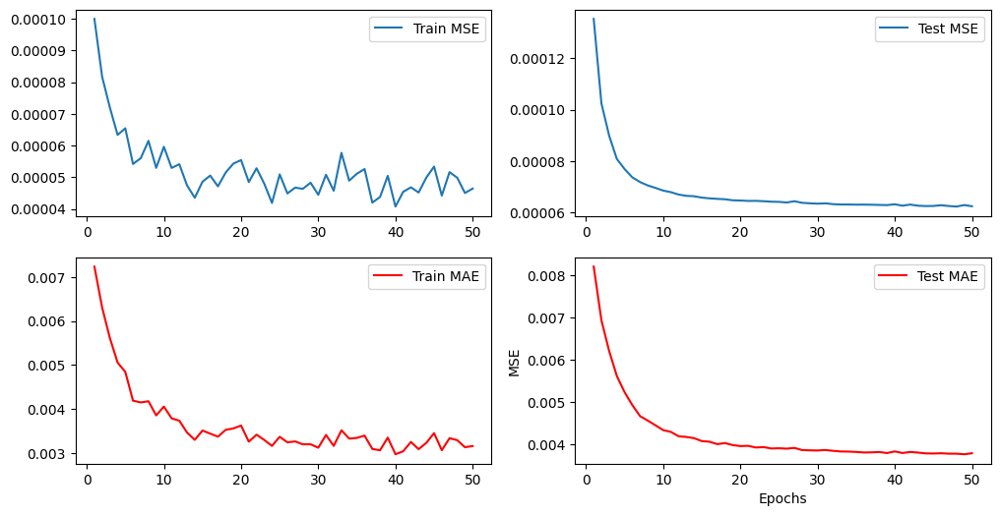

In [ ]:
import matplotlib.pyplot as plt
EPOCHS = 50
BATCH_SIZE = 25
if(type(mae_test[1])!=type(0.)):
  mae_test = [tensor.item() for tensor in mae_test]
  mae_train = [tensor.item() for tensor in mae_train]
fig, ax = plt.subplots(2, 2, figsize = (12, 6))
ax[0][0].plot(range(1, EPOCHS + 1), mse_train, label='Train MSE')
ax[0][0].legend()
ax[0][1].plot(range(1, EPOCHS + 1), mse_test, label='Test MSE')
ax[0][1].legend()
ax[1][0].plot(range(1, EPOCHS + 1), mae_train, label='Train MAE', color = 'r')
ax[1][0].legend()
ax[1][1].plot(range(1, EPOCHS + 1), mae_test, label='Test MAE', color = 'r')
ax[1][1].legend()



plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.show()
fig.savefig(f'results/erori.png')



In [ ]:
# load model salvat pentru a face teste pe diferite audio

model = Network()
model.load_state_dict(torch.load("saved_model.pt"))
model.eval()

FIXED_LENGTH = 2 * 16000

def process_audio(input_file="", output_file="", signal = []):
    if(input_file):
        print(input_file)
        signal, fs = sf.read(input_file)
        print(sf.info(input_file).channels)

    signal = get_fix_length(signal)

    stft = librosa.stft(signal, hop_length=HOP_SIZE, n_fft=512, win_length=512)
    stft = stft / 10.
    stft = np.stack((np.real(stft), np.imag(stft)), dtype=np.float32)
    stft = stft[:,:-2,:]  ## remove 2 elements
    stft = np.concatenate((stft, np.zeros((2,255,4))), dtype=np.float32, axis=-1) ### add 4 zeros


    x = torch.tensor(stft).unsqueeze(0)


    with torch.no_grad():
        pred = model(x)
        pred = torch.concatenate((pred, torch.zeros(pred.shape[0], pred.shape[1], 2 ,pred.shape[3])), dim=-2)
        pred = pred[:,:,:,:-4]
        pred = pred.detach().cpu().numpy()[0,:,:,:]
        pred = pred[0] + pred[1]*1j
        x = x.detach().cpu().numpy()[0,:,:,:]
        x = x[0] + x[1]*1j
        x = librosa.istft(x, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
        enhanced = librosa.istft(pred, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
        scipy.io.wavfile.write(output_file, 16000,10 *  enhanced)



# Testare pe un fișier audio
# input_audio_file = "zgomot.wav"
# output_audio_file = "enhanced_audio.wav"
# process_audio(input_audio_file, output_audio_file)
# plt.show()


<ipython-input-17-0c5d1a6dd756>:15: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  librosa.display.specshow(x, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE, ax=axs[3], y_axis='log', x_axis='time', cmap='plasma')
<ipython-input-17-0c5d1a6dd756>:16: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  librosa.display.specshow(y, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE, ax=axs[4], y_axis='log', x_axis='time', cmap='plasma')


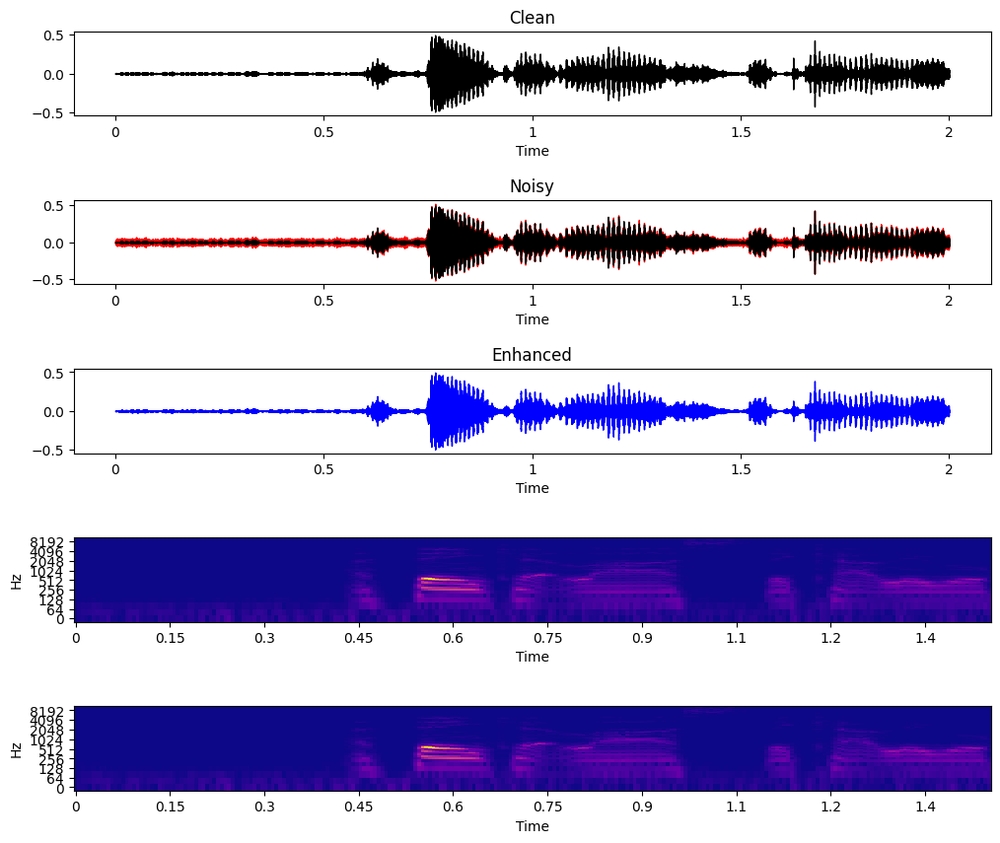

In [ ]:
import matplotlib.pyplot as plt
clean, noisy, enhanced = sf.read('results/clean.wav')[0], sf.read('results/noisy.wav')[0], sf.read('results/enhanced.wav')[0]
fig, axs = plt.subplots(5, figsize=(12,10))
librosa.display.waveshow(clean, sr=16000, ax=axs[0], color='k')
librosa.display.waveshow(noisy, sr=16000, ax=axs[1], color='r')
librosa.display.waveshow(clean, sr=16000, ax=axs[1], color='k')
librosa.display.waveshow(enhanced, sr=16000, ax=axs[2], color='b')
axs[0].set_title('Clean')
axs[1].set_title('Noisy')
axs[2].set_title('Enhanced')
plt.subplots_adjust(hspace=1)

x= librosa.stft(clean, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
y= librosa.stft(enhanced, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE)
librosa.display.specshow(x, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE, ax=axs[3], y_axis='log', x_axis='time', cmap='plasma')
librosa.display.specshow(y, hop_length=HOP_SIZE, n_fft=FRAME_SIZE, win_length=FRAME_SIZE, ax=axs[4], y_axis='log', x_axis='time', cmap='plasma')
fig.savefig(f'results/waveform.png')


# Exemplul salvat:


In [ ]:
import IPython.display as ipd
ipd.Audio(data= 'results/clean.wav', rate=16000)


In [ ]:
ipd.Audio(data= 'results/noisy.wav', rate=16000)


In [ ]:
ipd.Audio(data= 'results/enhanced.wav', rate=16000)


In [ ]:
def testSegment_aux(signal):
  x = signal

  total_samples = len(x)
  total_segments = total_samples // FIXED_LENGTH

  segments = []

  for i in range(total_segments):
      start_sample = i * FIXED_LENGTH
      end_sample = (i + 1) * FIXED_LENGTH
      segment = x[start_sample:end_sample]
      segments.append(segment)

  if total_samples % FIXED_LENGTH != 0:
      start_sample = total_segments * FIXED_LENGTH
      segment = x[start_sample:]
      segments.append(segment)

  last_segment_length = len(segments[-1])
  if last_segment_length < FIXED_LENGTH:
      padding = FIXED_LENGTH - last_segment_length
      segments[-1] = np.concatenate([segments[-1], np.zeros(padding)])

  return segments



In [ ]:
def testSegment_aux2(signal, op):
    segments = testSegment_aux(signal)
    output_dir = op
    print(output_dir)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir[:-1])
    else:
        for file_name in os.listdir(output_dir[:-1]):
              file_path = os.path.join(output_dir[:-1], file_name)
              os.remove(file_path)
    for i in range(len(segments)):
        process_audio(output_file = output_dir + str(i) +'.wav' , signal = segments[i])
    return op

In [ ]:
def testSegment(signal, output_dir, file_name):
    testSegment_aux2(signal, output_dir)
    fisieretest = sorted(os.listdir(output_dir), key=lambda x: [int(num) for num in re.findall(r'\d+', x)])
    print(fisieretest)
    fisieretest = [output_dir + x for x in fisieretest]
    data = [sf.read(x)[0] for x in fisieretest]
    data = np.array(data)
    print(data.shape)
    data=data.flatten()
    sf.write(file_name, data, 16000)


In [ ]:
signal = librosa.load('irl7.wav', sr=16000)[0]
testSegment(signal, 'testirl/', 'testirl.wav')

testirl/
['0.wav', '1.wav', '2.wav', '3.wav', '4.wav', '5.wav', '6.wav', '7.wav', '8.wav', '9.wav', '10.wav', '11.wav', '12.wav', '13.wav', '14.wav', '15.wav', '16.wav', '17.wav', '18.wav', '19.wav', '20.wav', '21.wav', '22.wav', '23.wav', '24.wav', '25.wav', '26.wav', '27.wav', '28.wav', '29.wav', '30.wav', '31.wav', '32.wav', '33.wav', '34.wav', '35.wav', '36.wav', '37.wav', '38.wav', '39.wav', '40.wav', '41.wav', '42.wav', '43.wav', '44.wav', '45.wav', '46.wav', '47.wav', '48.wav', '49.wav', '50.wav', '51.wav', '52.wav', '53.wav', '54.wav', '55.wav', '56.wav', '57.wav', '58.wav', '59.wav', '60.wav', '61.wav', '62.wav', '63.wav', '64.wav', '65.wav', '66.wav', '67.wav', '68.wav', '69.wav', '70.wav', '71.wav', '72.wav', '73.wav', '74.wav', '75.wav', '76.wav', '77.wav', '78.wav', '79.wav', '80.wav', '81.wav', '82.wav', '83.wav', '84.wav', '85.wav', '86.wav', '87.wav', '88.wav', '89.wav', '90.wav', '91.wav', '92.wav', '93.wav', '94.wav', '95.wav', '96.wav', '97.wav', '98.wav', '99.wav', 

# Exemplu zgomot adaugat manual pe sunet clar

[Sursa youtube](https://www.youtube.com/watch?v=VGaf2rsnM4s&t=7s)

In [ ]:
ipd.Audio(signal2, rate=16000)


In [ ]:
ipd.Audio('testyt.wav', rate=16000)


In [ ]:
# import os
# import glob

# director = '/content/'

# prefix = 'testirl'

# # Lista fisierelor care încep cu 'testirl'
# file_list = glob.glob(os.path.join(director, prefix + '*'))

# for file_path in file_list:
#     if os.path.isfile(file_path):
#       os.remove(file_path)
#     print(f"Fisierul '{file_path}' a fost șters.")


Fișierul '/content/testirl' a fost șters.
Fișierul '/content/testirl.wav' a fost șters.


In [ ]:
import zipfile
import os

folder_path = '/content/results'

zip_file = '/content/results.zip'

with zipfile.ZipFile(zip_file, 'w') as zipf:
    for root, _, files in os.walk(folder_path):
        for file in files:
            zipf.write(os.path.join(root, file),
                       os.path.relpath(os.path.join(root, file),
                                       os.path.join(folder_path, '..')))

from google.colab import files
files.download(zip_file)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>